In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import zipfile
with zipfile.ZipFile("/content/drive/MyDrive/НТИ ИИ /data_team/data_full_text.zip", 'r') as zip_ref:
    zip_ref.extractall("/content")

In [ ]:
import pandas as pd
import numpy as np
import os
import json
from tqdm.notebook import tqdm
import shutil

In [ ]:
import torch
print(torch.__version__)

1.10.0+cu111


In [ ]:
!nvidia-smi

Tue Mar  1 16:33:30 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   40C    P0    27W / 250W |      0MiB / 16280MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
#!conda install pytorch=1.6.0 torchvision cudatoolkit=10.1 -c pytorch
# Install MMCV
#!pip install mmcv-full -f https://download.openmmlab.com/mmcv/dist/cu111/torch1.10.0/mmcv_full-1.3.17-cp38-cp38-manylinux1_x86_64.whl
!pip install mmcv-full -f https://download.openmmlab.com/mmcv/dist/cu111/torch1.10/index.html

Looking in links: https://download.openmmlab.com/mmcv/dist/cu111/torch1.10/index.html
     |████████████████████████████████| 46.0 MB 12.8 MB/s 
     |████████████████████████████████| 190 kB 7.0 MB/s 


In [ ]:

!rm -rf mmdetection
!git clone https://github.com/open-mmlab/mmdetection.git
%cd mmdetection

!pip install -e .


Cloning into 'mmdetection'...
remote: Enumerating objects: 23435, done.
remote: Total 23435 (delta 0), reused 0 (delta 0), pack-reused 23435
Receiving objects: 100% (23435/23435), 26.05 MiB | 36.34 MiB/s, done.
Resolving deltas: 100% (16383/16383), done.
/content/mmdetection
Obtaining file:///content/mmdetection
  Running setup.py develop for mmdet


In [ ]:
!python setup.py develop

running develop
running egg_info
writing mmdet.egg-info/PKG-INFO
writing dependency_links to mmdet.egg-info/dependency_links.txt
writing requirements to mmdet.egg-info/requires.txt
writing top-level names to mmdet.egg-info/top_level.txt
reading manifest template 'MANIFEST.in'
adding license file 'LICENSE'
writing manifest file 'mmdet.egg-info/SOURCES.txt'
/usr/local/lib/python3.7/dist-packages/torch/utils/cpp_extension.py:381: UserWarning: Attempted to use ninja as the BuildExtension backend but we could not find ninja.. Falling back to using the slow distutils backend.
  warnings.warn(msg.format('we could not find ninja.'))
running build_ext
Creating /usr/local/lib/python3.7/dist-packages/mmdet.egg-link (link to .)
mmdet 2.22.0 is already the active version in easy-install.pth

Installed /content/mmdetection
Processing dependencies for mmdet==2.22.0
Searching for terminaltables==3.1.10
Best match: terminaltables 3.1.10
Adding terminaltables 3.1.10 to easy-install.pth file

Using /usr/

In [ ]:
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())

# Check MMDetection installation
import mmdet
print(mmdet.__version__)

# Check mmcv installation
from mmcv.ops import get_compiling_cuda_version, get_compiler_version
print(get_compiling_cuda_version())
print(get_compiler_version())

1.10.0+cu111 True
2.22.0
11.1
GCC 7.3


In [ ]:
with open('/content/data/train_segmentation/annotations.json') as f:
    data = json.load(f)


In [ ]:
val = dict(categories=[{'id': 1, 'name': 'text', 'supercategory': ''}], 
           images=[],
           annotations=[])
train = dict(categories=[{'id': 1, 'name': 'text', 'supercategory': ''}], 
           images=[],
           annotations=[])
for index, d in enumerate(data['images']):
  print(f"{index}/{len(data['images'])}")
  if index % 11 == 0:
    val['images'].append(d)
    for i in data['annotations']:
      if i['image_id'] == d['id']:
        val['annotations'].append(i)
  else:
    train['images'].append(d)
    for i in data['annotations']:
      if i['image_id'] == d['id']:
        train['annotations'].append(i)

    

In [ ]:
path2save = 'train'
for i in tqdm(train['images']):
  name = i['file_name']
  if not os.path.exists('convertor/{}/images/'.format(path2save)):
                os.makedirs('convertor/{}/images/'.format(path2save))
  shutil.copy("/content/data/train_segmentation/images/{}".format(name),'convertor/{}/images/'.format(path2save,name))
with open(('convertor/{}/annotations.json'.format(path2save)), 'w', encoding='utf8') as f:
  json.dump(train, f, ensure_ascii=False, indent=4)

path2save = 'val'
for i in tqdm(val['images']):
  name = i['file_name']
  if not os.path.exists('convertor/{}/images/'.format(path2save)):
                os.makedirs('convertor/{}/images/'.format(path2save))
  shutil.copy("/content/data/train_segmentation/images/{}".format(name),'convertor/{}/images/'.format(path2save,name))
with open(('convertor/{}/annotations.json'.format(path2save)), 'w', encoding='utf8') as f:
  json.dump(val, f, ensure_ascii=False, indent=4)

# with open("config.py", 'w') as f:
#   f.write(config)

  0%|          | 0/785 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

In [ ]:
!pwd

/content


In [ ]:
import os
from mmdet.datasets import build_dataset
from mmdet.models import build_detector
from mmdet.apis import train_detector
import glob
import cv2
import shutil
import random
import os.path as osp
import json
import mmcv
import re
import xml.etree.ElementTree as ET
from typing import Dict, List

In [ ]:
!pwd

/content


In [ ]:
%cd mmdetection

/content/mmdetection


In [ ]:
!pwd

/content/mmdetection


In [ ]:
!mkdir checkpoints
!wget -c https://download.openmmlab.com/mmdetection/v2.0/mask_rcnn/mask_rcnn_x101_64x4d_fpn_mstrain-poly_3x_coco/mask_rcnn_x101_64x4d_fpn_mstrain-poly_3x_coco_20210526_120447-c376f129.pth \
      -O checkpoints/model1.pth

mkdir: cannot create directory ‘checkpoints’: File exists
--2022-03-01 17:48:10--  https://download.openmmlab.com/mmdetection/v2.0/mask_rcnn/mask_rcnn_x101_64x4d_fpn_mstrain-poly_3x_coco/mask_rcnn_x101_64x4d_fpn_mstrain-poly_3x_coco_20210526_120447-c376f129.pth
Resolving download.openmmlab.com (download.openmmlab.com)... 47.88.36.72
Connecting to download.openmmlab.com (download.openmmlab.com)|47.88.36.72|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 410110191 (391M) [application/octet-stream]
Saving to: ‘checkpoints/model1.pth’

checkpoints/model1. 100%[===================>] 391.11M  7.52MB/s    in 58s     

2022-03-01 17:49:09 (6.71 MB/s) - ‘checkpoints/model1.pth’ saved [410110191/410110191]



In [ ]:
with open('/content/labels.txt', 'w') as f:
  f.write('text')

In [ ]:
from mmcv import Config
cfg = Config.fromfile('configs/mask_rcnn/mask_rcnn_x101_32x8d_fpn_mstrain-poly_3x_coco.py')
from mmdet.apis import set_random_seed
print(cfg.model.keys())
cfg.dataset_type = 'CocoDataset'
cfg.classes = '/content/labels.txt'
cfg.data_root = '/content/mmdetection/converter'
cfg.model.roi_head.bbox_head.num_classes = 1
cfg.model.roi_head.mask_head.num_classes = 1

# for i in range(len(cfg.model.roi_head.bbox_head)):
#   cfg.model.roi_head.bbox_head[i].num_classes = 1
# for i in range(len(cfg.model.roi_head.mask_head)):  
#   cfg.model.roi_head.mask_head[i].num_classes = 1

cfg.data.test.type = 'CocoDataset'
cfg.data.test.classes = '/content/labels.txt'
cfg.data.test.data_root = '/content/mmdetection/convertor/val'
cfg.data.test.ann_file = 'annotations.json'
cfg.data.test.img_prefix = 'images'

cfg.data.train.type = 'CocoDataset'
cfg.data.train.data_root = '/content/mmdetection/convertor/train'
cfg.data.train.ann_file = 'annotations.json'
cfg.data.train.img_prefix = 'images'
cfg.data.train.classes = '/content/labels.txt'

cfg.data.val.type = 'CocoDataset'
cfg.data.val.classes = '/content/labels.txt'
cfg.data.val.data_root = '/content/mmdetection/convertor/val'
cfg.data.val.ann_file = 'annotations.json'
cfg.data.val.img_prefix = 'images'

#cfg.load_from = '../input/retinanet/retinanet_r101_fpn_1x_coco_20200130-7a93545f (1).pth'

cfg.work_dir = './'

# The original learning rate (LR) is set for 8-GPU training.
# You divide it by 8 since you only use one GPU with Kaggle.
cfg.optimizer.lr = 0.01 / 8
cfg.optimizer_config.grad_clip = dict(max_norm=35, norm_type=2)

#cfg.lr_config.policy = 'step'
cfg.lr_config.step = 7
cfg.data.samples_per_gpu = 1
cfg.data.workers_per_gpu = 1
cfg.evaluation.metric = 'bbox'
cfg.evaluation.interval = 4
cfg.checkpoint_config.interval = 12
cfg.log_config.interval = 100
cfg.runner.max_epochs = 24
cfg.model.test_cfg.max_per_img = 1000
cfg.model.test_cfg.rcnn.max_per_img = 1000
cfg.model.test_cfg.max_per_img = 1000
cfg.model.test_cfg.rcnn.mask_thr_binary = 0.3


cfg.model.train_cfg.max_per_img = 1000
cfg.model.train_cfg.rcnn.max_per_img = 1000
cfg.model.train_cfg.max_per_img = 1000

cfg.seed = 0
set_random_seed(0, deterministic=False)
cfg.gpu_ids = range(1)
cfg.load_from = 'checkpoints/model1.pth'
#print(f'Config:\n{cfg.pretty_text}')

dict_keys(['type', 'backbone', 'neck', 'rpn_head', 'roi_head', 'train_cfg', 'test_cfg'])


In [ ]:
cfg.data.train

{'ann_file': 'annotations.json',
 'classes': '/content/labels.txt',
 'data_root': '/content/mmdetection/convertor/train',
 'img_prefix': 'images',
 'pipeline': [{'type': 'LoadImageFromFile'},
  {'poly2mask': False,
   'type': 'LoadAnnotations',
   'with_bbox': True,
   'with_mask': True},
  {'img_scale': [(1333, 640), (1333, 800)],
   'keep_ratio': True,
   'multiscale_mode': 'range',
   'type': 'Resize'},
  {'flip_ratio': 0.5, 'type': 'RandomFlip'},
  {'mean': [103.53, 116.28, 123.675],
   'std': [57.375, 57.12, 58.395],
   'to_rgb': False,
   'type': 'Normalize'},
  {'size_divisor': 32, 'type': 'Pad'},
  {'type': 'DefaultFormatBundle'},
  {'keys': ['img', 'gt_bboxes', 'gt_labels', 'gt_masks'], 'type': 'Collect'}],
 'type': 'CocoDataset'}

In [ ]:
datasets = [build_dataset(cfg.data.train)]
model = build_detector(
 cfg.model, train_cfg=cfg.get('train_cfg'), test_cfg=cfg.get('val_cfg'))
model.CLASSES = datasets[0].CLASSES
mmcv.mkdir_or_exist(osp.abspath(cfg.work_dir))


loading annotations into memory...
Done (t=3.12s)
creating index...
index created!


In [ ]:
model.CLASSES

['text']

In [ ]:
type(model)

mmdet.models.detectors.mask_rcnn.MaskRCNN

In [ ]:
cfg.work_dir

'./'

In [ ]:
train_detector(model, datasets, cfg, distributed=False, validate=False)

2022-03-01 18:05:12,353 - mmdet - INFO - load checkpoint from local path: checkpoints/model1.pth
2022-03-01 18:05:12,658 - mmdet - WARNING - The model and loaded state dict do not match exactly

size mismatch for backbone.layer1.0.conv2.weight: copying a param with shape torch.Size([256, 4, 3, 3]) from checkpoint, the shape in current model is torch.Size([256, 8, 3, 3]).
size mismatch for backbone.layer1.1.conv2.weight: copying a param with shape torch.Size([256, 4, 3, 3]) from checkpoint, the shape in current model is torch.Size([256, 8, 3, 3]).
size mismatch for backbone.layer1.2.conv2.weight: copying a param with shape torch.Size([256, 4, 3, 3]) from checkpoint, the shape in current model is torch.Size([256, 8, 3, 3]).
size mismatch for backbone.layer2.0.conv2.weight: copying a param with shape torch.Size([512, 8, 3, 3]) from checkpoint, the shape in current model is torch.Size([512, 16, 3, 3]).
size mismatch for backbone.layer2.1.conv2.weight: copying a param with shape torch.Size(

In [ ]:
!python tools/train.py config.py --no-validate

Traceback (most recent call last):
  File "tools/train.py", line 209, in <module>
    main()
  File "tools/train.py", line 105, in main
    setup_multi_processes(cfg)
  File "/content/mmdetection/mmdet/utils/setup_env.py", line 30, in setup_multi_processes
    if 'OMP_NUM_THREADS' not in os.environ and cfg.data.workers_per_gpu > 1:
  File "/usr/local/lib/python3.7/dist-packages/mmcv/utils/config.py", line 510, in __getattr__
    return getattr(self._cfg_dict, name)
  File "/usr/local/lib/python3.7/dist-packages/mmcv/utils/config.py", line 48, in __getattr__
    raise ex
AttributeError: 'ConfigDict' object has no attribute 'data'


In [ ]:
from mmdet.apis import init_detector, inference_detector, show_result_pyplot
import mmcv

In [ ]:
print(cfg.model.test_cfg.max_per_img)

1000


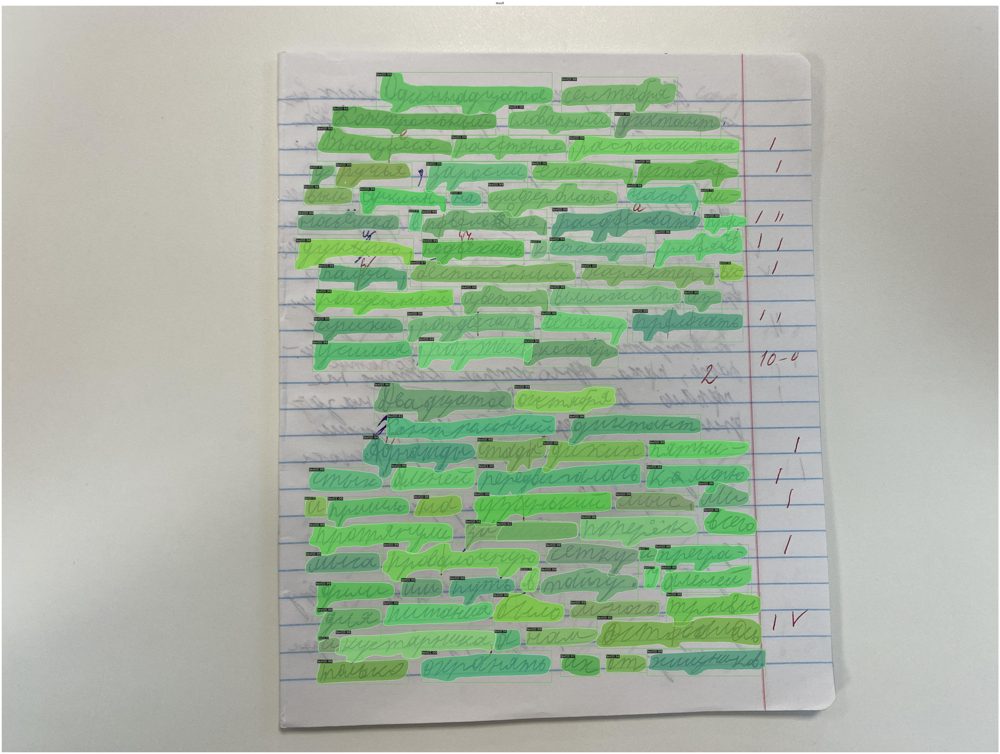

In [ ]:
model.cfg = cfg
img = mmcv.imread('/content/100_0.JPG')
result = inference_detector(model, img)
show_result_pyplot(model, img, result, score_thr=0.3)

In [ ]:
from google.colab import files
files.download('./mmdetection/latest.pth') 

FileNotFoundError: ignored